# **CVDL Project 2024–25: Comparison of YOLOv3 vs Faster R-CNN**
### **Dataset used**: PSU Car Dataset (aerial images) https://www.kaggle.com/datasets/riotulab/aerial-images-of-cars or  https://github.com/aniskoubaa/psu-car-dataset
### **Goal** : Performance comparison for object detection
### **Reference paper** :  Aerial Images Processing for Car Detection using Convolutional Neural Networks: Comparison between Faster R-CNN and YoloV3 https://arxiv.org/pdf/1910.07234v3

Authors : Johanna RAKOTOVAO, Leela PARHYAR

## **0. Prerequisites: mounting Google Drive and installing dependencies**


In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("riotulab/aerial-images-of-cars")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/aerial-images-of-cars


In [2]:
# Install dependencies (pycocotools, etc.)
!pip -q install pycocotools tqdm albumentations

## **1. Imports & seed**

In [3]:
import os, time, json, random, shutil, math
import numpy as np, pandas as pd, cv2, matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
from torch.utils.data import DataLoader, Subset
from tqdm.notebook import tqdm
import xml.etree.ElementTree as ET
import glob
import matplotlib.pyplot as plt

SEED = 66
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using', DEVICE)

Using cuda


The dataset is organized into .jpg files for aerial images and .xml files (in Pascal VOC format) for car annotations. We go through the directory to retrieve the list of image and annotation files, and display a few examples.

We check if .jpg and .xml files are extracted correctly.

In [4]:
data_path = "/kaggle/input/aerial-images-of-cars"

# Find all .jpg and .xml files recursively
jpg_files = glob.glob(f"{data_path}/**/*.jpg", recursive=True)
xml_files = glob.glob(f"{data_path}/**/*.xml", recursive=True)

print(f"Number of .jpg images found: {len(jpg_files)}")
print(f"Number of .xml annotation files found: {len(xml_files)}")

# Preview a few entries
for i in range(min(3, len(jpg_files))):
    print(f"- Image: {jpg_files[i]}")
    print(f"  Annotation: {xml_files[i]}")

Number of .jpg images found: 270
Number of .xml annotation files found: 270
- Image: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/MOS165.jpg
  Annotation: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/DJI-00760-00039.xml
- Image: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/04441.jpg
  Annotation: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/DJI_0011.xml
- Image: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/01081.jpg
  Annotation: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/DJI-00760-00014.xml


We display 1 annotated image (with ground truth bounding boxes from XML)

Image path: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/00841.jpg
XML path: /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU/00841.xml


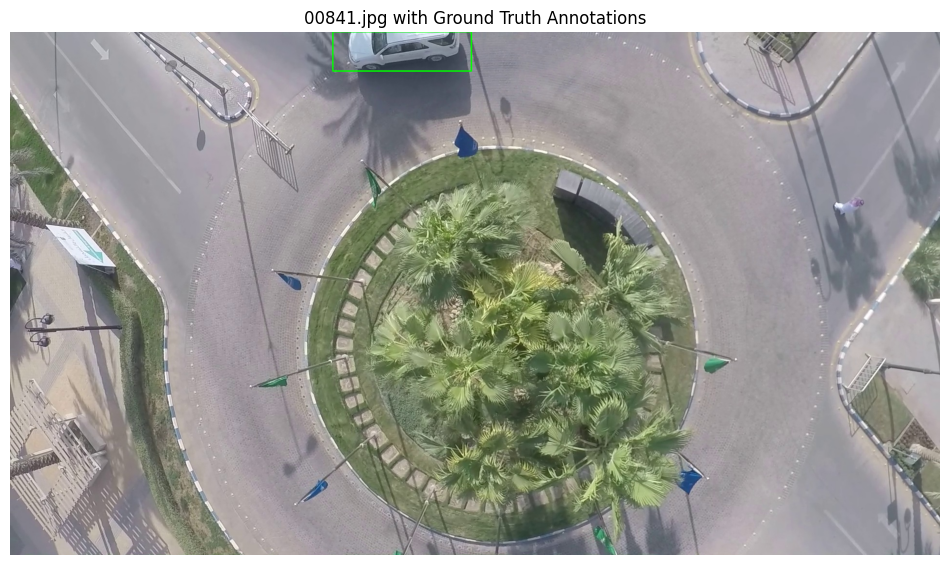

In [5]:
# Automatically find the paths
img_files = sorted(glob.glob("/kaggle/input/aerial-images-of-cars/**/*.jpg", recursive=True))
xml_files = sorted(glob.glob("/kaggle/input/aerial-images-of-cars/**/*.xml", recursive=True))

# Select an example
img_path = [p for p in img_files if "00841.jpg" in p]
xml_path = [p for p in xml_files if "00841.xml" in p]

img_path = img_path[0]
xml_path = xml_path[0]

# Debug print
print("Image path:", img_path)
print("XML path:", xml_path)

# Load the image
image = cv2.imread(img_path)
if image is None:
    raise FileNotFoundError(f"Image not found at path: {img_path}")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Parse XML
tree = ET.parse(xml_path)
root = tree.getroot()

# Draw bounding boxes
for obj in root.findall('object'):
    label = obj.find('name').text
    bbox = obj.find('bndbox')
    xmin = int(bbox.find('xmin').text)
    ymin = int(bbox.find('ymin').text)
    xmax = int(bbox.find('xmax').text)
    ymax = int(bbox.find('ymax').text)

    # Draw the box and label
    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX,
                0.9, (36, 255, 12), 2)

# Show the result
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.title(f"{os.path.basename(img_path)} with Ground Truth Annotations")
plt.axis("off")
plt.show()

In [6]:
train_ids = set(os.path.splitext(os.path.basename(p))[0] for p in glob.glob(".../train_PSU/*.xml"))
test_ids  = set(os.path.splitext(os.path.basename(p))[0] for p in glob.glob(".../test_PSU/*.xml"))

overlap = train_ids & test_ids
print(f"Number of overlapping image IDs: {len(overlap)}")

Number of overlapping image IDs: 0


We confirmed that there is no data leakage between training and test sets.
By comparing the image IDs extracted from `train_PSU/*.xml` and `test_PSU/*.xml`,
we found **zero overlap**. This ensures a clean split between training and test datasets.


## **2. Loading the PSU dataset (COCO format)**

We first locate the subfolders that contain the XML annotation files.  
These XML files follow the Pascal VOC format and are stored separately for training and testing.

In [7]:
import itertools
# Search the dataset directory for subfolders containing .xml files
SEARCH_ROOT = '/kaggle/input/aerial-images-of-cars/Aerial-cars'
xml_dirs = set()

for root, _, files in os.walk(SEARCH_ROOT):
    if any(fn.endswith('.xml') for fn in files):
        xml_dirs.add(root)
        if len(xml_dirs) >= 5:  # Stop after finding enough xml folders
            break

print("\nFolders containing .xml files :")
for d in xml_dirs:
    print("  ->", d)


Folders containing .xml files :
  -> /kaggle/input/aerial-images-of-cars/Aerial-cars/test_PSU
  -> /kaggle/input/aerial-images-of-cars/Aerial-cars/train_PSU


We convert the annotation files (from both the training and test sets) from Pascal VOC format to COCO JSON format.  
This conversion is necessary to use the dataset with common object detection models (like YOLOv3 and Faster R-CNN) and evaluation tools.


In [8]:
# convert_voc_to_coco.py - to be run ONCE only
import os, json, glob, xml.etree.ElementTree as ET
from tqdm import tqdm

# Define root folder and input/output paths
ROOT = '/kaggle/input/aerial-images-of-cars/Aerial-cars'  # chemin lecture seule
OUT = '/kaggle/working/annotations'  # chemin où on peut écrire
os.makedirs(OUT, exist_ok=True)

SPLIT = {
    'train': f'{ROOT}/train_PSU',
    'test': f'{ROOT}/test_PSU'
}

# Function to convert Pascal VOC XML files to COCO JSON format
def voc2coco(voc_dir):
    imgs, anns, img_id, ann_id = [], [], 1, 1
    for xml in tqdm(sorted(glob.glob(os.path.join(voc_dir, '*.xml')))):
        r   = ET.parse(xml).getroot()
        fn  = r.findtext('filename')
        w,h = int(r.find('size/width').text), int(r.find('size/height').text)
        imgs.append({"id": img_id, "file_name": f'{os.path.basename(voc_dir)}/{fn}',
                     "width": w, "height": h})
        # Loop through all object tags in the XML (only keep 'car')
        for obj in r.findall('object'):
            if obj.findtext('name') != 'car': continue
            bb = obj.find('bndbox')
            x1,y1,x2,y2 = map(lambda t: int(float(t.text)),
                              [bb.find('xmin'),bb.find('ymin'),
                               bb.find('xmax'),bb.find('ymax')])
            anns.append({"id":ann_id,"image_id":img_id,"category_id":1,
                         "bbox":[x1,y1,x2-x1,y2-y1],"area":(x2-x1)*(y2-y1),
                         "iscrowd":0})
            ann_id += 1
        img_id += 1
    return {"images":imgs,"annotations":anns,
            "categories":[{"id":1,"name":"car","supercategory":"vehicle"}]}
# Generate COCO JSON files for train and test splits
for split, path in SPLIT.items():
    coco = voc2coco(path)
    out  = f'{OUT}/aerial_cars_{split}.json'
    with open(out,'w') as f: json.dump(coco,f,indent=2)
    print(f'{split:<5} -> {out} | {len(coco["images"]):3} imgs | {len(coco["annotations"])} boxes')

100%|██████████| 218/218 [00:00<00:00, 601.83it/s]


train -> /kaggle/working/annotations/aerial_cars_train.json | 218 imgs | 3364 boxes


100%|██████████| 52/52 [00:00<00:00, 716.25it/s]


test  -> /kaggle/working/annotations/aerial_cars_test.json |  52 imgs | 738 boxes


### Dataset and DataLoader setup

We define a custom `COCODataset` class to load the images and annotations using the COCO format (converted earlier).  
This class reads image files and associated bounding boxes, returning the necessary inputs for object detection training.

We also define a `get_transform()` function to apply basic preprocessing and data augmentation.  
Finally, we prepare the DataLoader utilities to be used during training and validation.


In [9]:
from pycocotools.coco import COCO

IMG_DIR = '/kaggle/input/aerial-images-of-cars/Aerial-cars'      # Path to the image folder
ANN_TRAIN = '/kaggle/working/annotations/aerial_cars_train.json' # Path to the COCO-style training annotations
ANN_TEST  = '/kaggle/working/annotations/aerial_cars_test.json'  # Path to the COCO-style test annotations

# Initialize the dataset with image directory and annotation file
class COCODataset(torch.utils.data.Dataset):
    def __init__(self, img_folder, ann_file, transforms=None):
        self.coco = COCO(ann_file)
        self.ids  = list(sorted(self.coco.imgs.keys()))
        self.img_folder = img_folder
        self.transforms = transforms or T.Compose([T.ToTensor()])
    # Load image and annotations
    def __getitem__(self, idx):
        img_id = self.ids[idx]
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)

        path = self.coco.loadImgs(img_id)[0]['file_name']
        img  = cv2.imread(os.path.join(self.img_folder, path))
        img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        boxes, labels, areas, iscrowd = [], [], [], []
        for a in anns: # Loop through all annotations for this image
            xmin, ymin, w, h = a['bbox']
            boxes.append([xmin, ymin, xmin+w, ymin+h])
            labels.append(1)      # single class: car
            areas.append(a['area'])
            iscrowd.append(a.get('iscrowd', 0))
        # Format target dictionary for the model
        target = {
            'boxes': torch.as_tensor(boxes, dtype=torch.float32),
            'labels': torch.as_tensor(labels, dtype=torch.int64),
            'area':   torch.as_tensor(areas, dtype=torch.float32),
            'iscrowd':torch.as_tensor(iscrowd, dtype=torch.int64),
            'image_id': torch.tensor([img_id])
        }

        img = self.transforms(img)
        return img, target

    def __len__(self):
        return len(self.ids)

# Image transformations
def get_transform(train):
    transforms = [T.ToTensor()]
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
        transforms.append(T.ColorJitter(brightness=0.2, contrast=0.2))
        transforms.append(T.RandomGrayscale(p=0.1))
    return T.Compose(transforms)

# Collate function
def collate_fn(batch):
    return tuple(zip(*batch))

# datasets (# COCO-style datasets for YOLOv3)
train_ds = COCODataset(IMG_DIR, ANN_TRAIN, transforms=get_transform(train=True))
test_ds   = COCODataset(IMG_DIR, ANN_TEST,    transforms=get_transform(train=False))

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [10]:
print("len(train_ds) =", len(train_ds))
print("len(test_ds)   =", len(test_ds))

len(train_ds) = 218
len(test_ds)   = 52


In [11]:
# dataloaders (for Faster R-CNN)
train_dl = torch.utils.data.DataLoader(train_ds, batch_size=2, shuffle=True,
                                       collate_fn=collate_fn)
test_dl   = torch.utils.data.DataLoader(test_ds,   batch_size=2, shuffle=False,
                                       collate_fn=collate_fn)

## **3. Quick visualization of a few annotations**

We display a few training samples with ground-truth boxes to check that the XML annotations were correctly converted to COCO format and loaded properly by our PyTorch dataset.

This step helps verify that the annotation conversion (VOC → COCO) was successful.


In [12]:
def show_sample(dataset, idx=0, color=(0, 85, 255), thickness=10):
    # Load one sample (image + target dictionary) from the dataset
    img, target = dataset[idx]

    # Convert image tensor (C, H, W) to NumPy (H, W, C), scale to [0,255] range and cast to uint8
    img_np = (img.permute(1, 2, 0).numpy() * 255).astype(np.uint8)  # RGB
    # Convert RGB image to BGR (OpenCV format)
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
    # Draw bounding boxes from the target['boxes']
    for (x1, y1, x2, y2) in target['boxes']:
        cv2.rectangle(img_bgr,
                      (int(x1), int(y1)), (int(x2), int(y2)),
                      color, thickness)
    # Convert back to RGB for displaying with matplotlib
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    # Show the final image with boxes
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

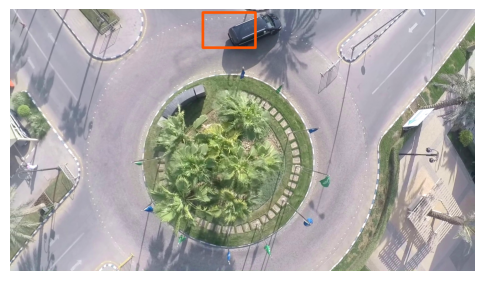

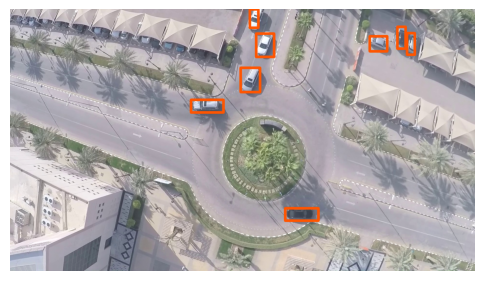

In [13]:
show_sample(train_ds, idx=12)
show_sample(train_ds, idx=101)

## **4. Model 1: Faster R-CNN (ResNet-50 FPN)**

We define a function `get_faster_rcnn()` to load a Faster R-CNN model pre-trained on COCO, and adapt it to our dataset with a single class ("car").


In [14]:
from torchvision.models.detection.faster_rcnn import fasterrcnn_resnet50_fpn, FastRCNNPredictor

# Define a function to load and customize Faster R-CNN
def get_faster_rcnn(num_classes=2):
    # Load a Faster R-CNN model pre-trained on COCO
    model = fasterrcnn_resnet50_fpn(weights='DEFAULT')
    # Get the number of input features for the classifier (ROI head)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # Replace the pre-trained head with a new one that matches our number of classes
    # (1 class "car" + background)
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

In [15]:
# Instantiate the model and move it to the device (GPU or CPU)
faster_model = get_faster_rcnn().to(DEVICE)

## **5. Model 2: YOLOv3 (Darknet-53 – PyTorch-YOLOv3 repository)**

We train YOLOv3 on the same PSU car dataset to compare it with Faster R-CNN.  
This requires converting COCO annotations to YOLO format (i.e., `.txt` files with normalized bounding box coordinates) and organizing the dataset correctly. We first convert the COCO-style `.json` annotations into YOLO-style `.txt` files

In [16]:
import sys
sys.path.append('/content/yolo')

In [17]:
!pip -q install ultralytics

In [18]:
# Convert .json (COCO) to .txt (YOLO format)
import os, json, shutil
from collections import defaultdict

def coco_to_yolo(coco_json, output_dir, class_id_offset=-1):
    # prepare a clean folder
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    os.makedirs(output_dir, exist_ok=True)

    # read COCO annotations
    with open(coco_json, "r") as f:
        coco = json.load(f)
    # Create mappings from image ID to image info and annotations
    img_id_to_info = {img["id"]: img for img in coco["images"]}
    img_id_to_anns = defaultdict(list)
    for ann in coco["annotations"]:
        img_id_to_anns[ann["image_id"]].append(ann)

    # 2. convert each annotation to YOLO format
    nb_boxes = 0
    for img_id, anns in img_id_to_anns.items():
        info   = img_id_to_info[img_id]
        w_img, h_img = info["width"], info["height"]
        base   = os.path.splitext(os.path.basename(info["file_name"]))[0]
        label_path = os.path.join(output_dir, base + ".txt")

        lines = []
        for ann in anns:
            if ann["category_id"] != 1:          # keep only 'car'
                continue
            x, y, w, h = ann["bbox"]
            xc = (x + w/2) / w_img
            yc = (y + h/2) / h_img
            nw =  w / w_img                    # Calculate normalized coordinates
            nh =  h / h_img
            cls = ann["category_id"] + class_id_offset   # 1 -> 0
            lines.append(f"{cls} {xc:.6f} {yc:.6f} {nw:.6f} {nh:.6f}")

        if lines:                                    # only if ≥1 box
            with open(label_path, "w") as f:
                f.write("\n".join(lines) + "\n")
            nb_boxes += len(lines)

    print(f" {os.path.basename(coco_json)} -> {nb_boxes} boxes converties")


We prepare a separate directory structure for YOLOv3, where images and labels are stored in the following format:
```
Aerial-cars-yolo/
├── train/
│   ├── images/
│   └── labels/
└── test/
├── images/
└── labels/

```
We copy all images into their corresponding folders, then convert the annotations from COCO to YOLO format.


In [19]:
# Define YOLO folder structure
YOLO_ROOT = '/content/Aerial-cars-yolo'
for split in ('train', 'test'):
    # Create subfolders for images and labels
    os.makedirs(f'{YOLO_ROOT}/{split}/images', exist_ok=True)
    os.makedirs(f'{YOLO_ROOT}/{split}/labels', exist_ok=True)

# Set original VOC source paths
ROOT = '/kaggle/input/aerial-images-of-cars/Aerial-cars'
VOC_TRAIN = f'{ROOT}/train_PSU'
VOC_TEST = f'{ROOT}/test_PSU'

# Copy images from VOC folders to YOLO folders
for src_dir, dst_dir in [(VOC_TRAIN, f'{YOLO_ROOT}/train/images'),
                         (VOC_TEST, f'{YOLO_ROOT}/test/images')]:
    for img_path in glob.glob(f"{src_dir}/*.jpg"):
        shutil.copy(img_path, dst_dir)

We now convert the COCO-style `.json` annotations to YOLO `.txt` format, where each file corresponds to one image and contains one line per bounding box with the format:



In [20]:
# COCO to YOLO conversion (train & test)
coco_to_yolo(ANN_TRAIN, f'{YOLO_ROOT}/train/labels')
coco_to_yolo(ANN_TEST,  f'{YOLO_ROOT}/test/labels')

 aerial_cars_train.json -> 3364 boxes converties
 aerial_cars_test.json -> 738 boxes converties


In [21]:
# Preview a few converted YOLO annotation files (.txt)
label_files = sorted(glob.glob(f"{YOLO_ROOT}/train/labels/*.txt"))
sample_files = random.sample(label_files, 2)

for path in sample_files:
    print(f"\n-> {os.path.basename(path)}")
    with open(path, "r") as f:
        print(f.read())


-> 01531.txt
0 0.375000 0.126852 0.084375 0.101852


-> 04681.txt
0 0.430469 0.351852 0.075521 0.051852
0 0.466667 0.758796 0.056250 0.080556
0 0.570312 0.766667 0.076042 0.064815



Ultralytics' YOLOv3 expects a `.yaml` configuration file that specifies the paths to the training and test images and the list of class names.

In [22]:
yaml_text = """
path: /content/Aerial-cars-yolo
train: train/images
val: test/images
names:
  0: car
"""
with open("psu.yaml", "w") as f:  # Write the YAML content to a file
    f.write(yaml_text)
print(" psu.yaml written")

 psu.yaml written


In [40]:
from ultralytics import YOLO
DEVICE = 0 if torch.cuda.is_available() else 'cpu'

In [41]:
model = YOLO("yolov3u.pt") # Load YOLOv3 model

model.train(
    data="psu.yaml",
    epochs=10,
    imgsz=640,
    batch=16,
    device=DEVICE,
    project="runs",   # Output directory
    name="psu_yolov3",
    save=True,        # Save model + logs
    exist_ok=True     # Overwrite if folder already exists
)

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=psu.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov3u.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=psu_yolov35, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=Fa

train: Scanning /content/Aerial-cars-yolo/train/labels.cache... 218 images, 0 backgrounds, 0 corrupt: 100%|██████████| 218/218 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 902.1±629.6 MB/s, size: 365.1 KB)


val: Scanning /content/Aerial-cars-yolo/test/labels.cache... 52 images, 0 backgrounds, 0 corrupt: 100%|██████████| 52/52 [00:00<?, ?it/s]


Plotting labels to runs/psu_yolov35/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 84 weight(decay=0.0), 91 weight(decay=0.0005), 90 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/psu_yolov35
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      12.8G      1.685      3.219      1.057         84        640: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         52        738   0.000449    0.00949   0.000227   6.14e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      14.1G      1.627      1.408      1.022        220        640: 100%|██████████| 14/14 [00:17<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         52        738    0.00135     0.0285   0.000694   0.000253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10        14G      1.656      1.187      1.011        128        640: 100%|██████████| 14/14 [00:16<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         52        738   0.000256    0.00542   0.000129   3.86e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      14.4G       1.63     0.9754      1.002         78        640: 100%|██████████| 14/14 [00:16<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         52        738          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      13.6G       1.49     0.8252     0.9857        100        640: 100%|██████████| 14/14 [00:16<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         52        738    0.00255     0.0528    0.00132   0.000659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10        14G      1.467     0.8424     0.9868        150        640: 100%|██████████| 14/14 [00:16<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         52        738      0.788      0.719      0.787      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      14.1G      1.437     0.7973     0.9813         95        640: 100%|██████████| 14/14 [00:16<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         52        738      0.479      0.631      0.488      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      13.3G      1.287     0.6831      0.932         78        640: 100%|██████████| 14/14 [00:16<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]

                   all         52        738      0.895      0.866      0.925      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      14.1G       1.25     0.6698     0.9306        149        640: 100%|██████████| 14/14 [00:16<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         52        738      0.914      0.927       0.96      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10        14G      1.267      0.649     0.9224        108        640: 100%|██████████| 14/14 [00:16<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         52        738      0.921      0.932      0.962      0.659



10 epochs completed in 0.123 hours.
Optimizer stripped from runs/psu_yolov35/weights/last.pt, 207.7MB
Optimizer stripped from runs/psu_yolov35/weights/best.pt, 207.7MB

Validating runs/psu_yolov35/weights/best.pt...
Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv3 summary (fused): 96 layers, 103,665,011 parameters, 0 gradients, 282.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]


                   all         52        738      0.921      0.932      0.962      0.659
Speed: 0.1ms preprocess, 16.6ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/psu_yolov35


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f189d0753d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

We use the yolov3u.pt weights, which are pre-trained on the COCO dataset, and fine-tune them here to detect the single class: "car".

After training, YOLO automatically saves the checkpoint that achieved the best validation performance (based on metrics such as mAP).
We now load this best checkpoint for further evaluation or inference.

In [ ]:
yolo_model = YOLO("runs/psu_yolov3/weights/best.pt").to(DEVICE)

Here we retrieve the path to the best model checkpoint after training:


In [46]:
BEST_PT = model.ckpt_path
print("Fine-tune done :", BEST_PT)

Fine-tune done : yolov3u.pt


In [ ]:
!ls runs/psu_yolov3/weights

### Visualizing YOLOv3 training performance


We extract the box loss, classification loss, and mean average precision (mAP@0.5) for each epoch from the training logs.  
These metrics allow us to evaluate the training quality and convergence.

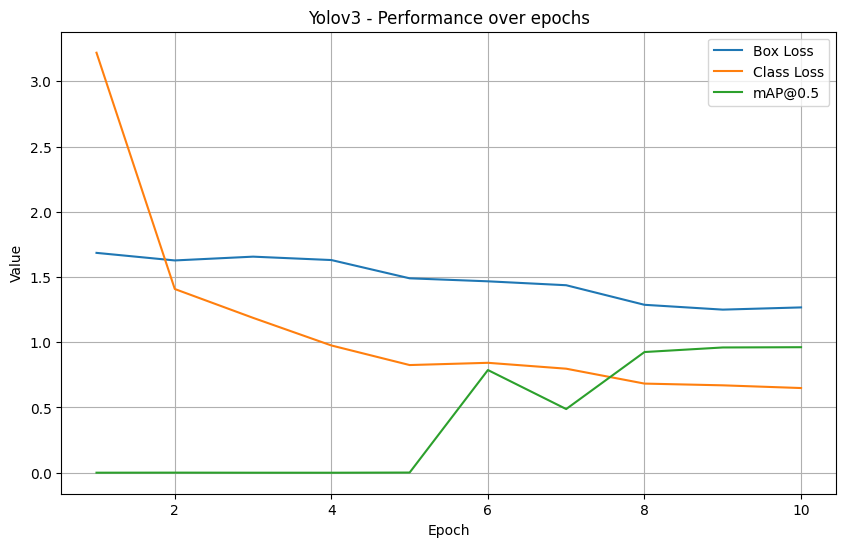

In [43]:
# Values from the training logs
epochs = list(range(1, 11))

box_loss = [1.685, 1.627, 1.656, 1.630, 1.490, 1.467, 1.437, 1.287, 1.250, 1.267]  # Box loss per epoch (lower is better)
cls_loss = [3.219, 1.408, 1.187, 0.9754, 0.8252, 0.8424, 0.7973, 0.6831, 0.6698, 0.649]  # Class loss per epoch (lower is better)
mAP50 =    [0.000227, 0.000694, 0.000129, 0.0, 0.00132, 0.787, 0.488, 0.925, 0.96, 0.962]  # mAP@0.5 per epoch (higher is better)

# Plot training metrics
plt.figure(figsize=(10, 6))
plt.plot(epochs, box_loss, label="Box Loss")  # Plot box loss
plt.plot(epochs, cls_loss, label="Class Loss")  # Plot class loss
plt.plot(epochs, mAP50, label="mAP@0.5")  # Plot mAP@0.5
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.title("Yolov3 - Performance over epochs")
plt.legend()
plt.grid(True)
plt.show()

The box loss decreases gradually over the epochs. The class loss drops quickly at the beginning and keeps decreasing. The mAP@0.5 stays at zero until epoch 5, then increases rapidly. This suggests the model starts detecting cars correctly from the middle of training. No sign of overfitting is visible. Training for more epochs could help stabilize performance further.

In [44]:
# mAP@0.5:0.95 curve
mAP5095 = [6.14e-05, 0.000253, 3.86e-05, 0.0, 0.000659, 0.476, 0.217, 0.577, 0.606, 0.659]  # mAP@0.5:0.95 values

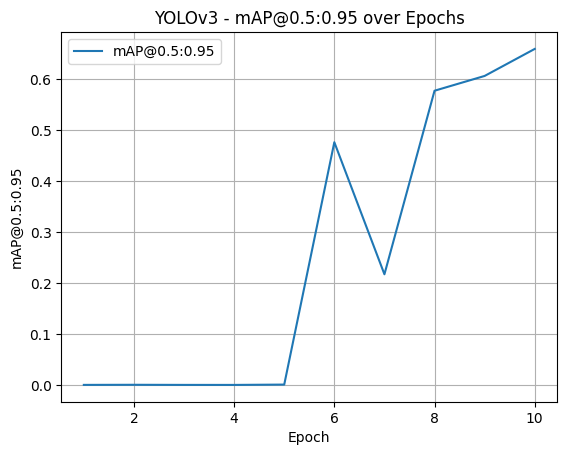

In [45]:
plt.plot(epochs, mAP5095, label="mAP@0.5:0.95")
plt.xlabel("Epoch")
plt.ylabel("mAP@0.5:0.95")
plt.title("YOLOv3 - mAP@0.5:0.95 over Epochs")
plt.grid(True)
plt.legend()
plt.show()

The mAP@0.5:0.95 starts near zero, then increases significantly after epoch 5, indicating a sharp improvement in model precision. This suggests the model began learning useful patterns after initial epochs of slow progress

## **6. Training & Evaluation Loop (Faster R-CNN)**


To evaluate the Faster R-CNN model, we use the COCO evaluation API `pycocotools`.  
We run inference on the validation dataset, collect predictions in COCO format and compute standard metrics like AP@[.50:.95], AP@0.5, and FPS.


In [47]:
#Get the COCO API from dataset, or raise an error if it's not available.
def get_coco_api_from_dataset(dataset):
    if isinstance(dataset, torch.utils.data.Subset):
        dataset = dataset.dataset
    if hasattr(dataset, 'coco'):
        return dataset.coco
    raise ValueError("Dataset does not have a 'coco' attribute.")

In [48]:
from pycocotools.cocoeval import COCOeval
import contextlib, io, time
#    Evaluates a Faster R-CNN model with the COCO API using a DataLoader.
def coco_eval_from_loader(model, data_loader,
                          iou_type="bbox", max_dets=[1, 10, 100]):
    coco_gt = get_coco_api_from_dataset(data_loader.dataset) ## Get ground truth annotations from the dataset

    for k in ("info", "licenses"):
        coco_gt.dataset.setdefault(k, [])

    coco_dt_items = []
    # Prepare model and timing
    model.eval()
    t_forward, n_imgs = 0.0, 0
    # Run inference on the dataset
    for images, targets in tqdm(data_loader, desc="FRCNN inference"):
        images = [i.to(DEVICE) for i in images]
        if torch.cuda.is_available():
            torch.cuda.synchronize()
        t0 = time.time()
        with torch.no_grad():
            outputs = model(images)
        if torch.cuda.is_available():
            torch.cuda.synchronize()
        t_forward += time.time() - t0
        n_imgs += len(images)

        # Converts the predictions to COCO format
        for out, tgt in zip(outputs, targets):
            img_id = int(tgt["image_id"])
            boxes  = out["boxes"].cpu().numpy()
            scores = out["scores"].cpu().numpy()
            for (x1, y1, x2, y2), s in zip(boxes, scores):
                coco_dt_items.append(
                    {
                        "image_id": img_id,
                        "category_id": 1,                # car
                        "bbox": [x1, y1, x2 - x1, y2 - y1],
                        "score": float(s),
                    }
                )

    fps = n_imgs / t_forward if t_forward else 0.0
    # Evaluate using COCO API
    coco_dt   = coco_gt.loadRes(coco_dt_items)
    cocoEval  = COCOeval(coco_gt, coco_dt, iou_type)
    cocoEval.params.maxDets = max_dets

    with contextlib.redirect_stdout(io.StringIO()):
        cocoEval.evaluate()
        cocoEval.accumulate()
    cocoEval.summarize()

    return cocoEval.stats[0], cocoEval.stats[1], fps      # AP@[0.50:0.95], AP@0.5, FPS

The function returns three values:

- `AP@[.50:.95]` (COCO-style average precision over multiple IoU thresholds)
- `AP@0.5` (PASCAL VOC-style AP at IoU = 0.5)
- `FPS` (inference speed in frames per second)

We will use these to compare Faster R-CNN and YOLOv3 performance.


### Training Loop for Faster R-CNN

We train the Faster R-CNN model using SGD optimizer for a fixed number of epochs.  
The model is evaluated every 5 epochs (and at the final epoch) using the COCO API to compute: AP@[.50:.95], AP@0.5 and FPS.

We track the training loss at each epoch to monitor convergence.


In [49]:
EPOCHS = 10
# Initialize the optimizer
optimizer = torch.optim.SGD(
    [p for p in faster_model.parameters() if p.requires_grad],
    lr=0.005, momentum=0.9, weight_decay=0.0005)

# Store average loss per epoch
avg_losses = []

for epoch in range(EPOCHS):
    faster_model.train()
    losses = []
    # Training loop over batches
    for imgs, tgts in train_dl:
        imgs = [i.to(DEVICE) for i in imgs]
        tgts = [{k: v.to(DEVICE) for k, v in t.items()} for t in tgts]
        #Compute the loss
        loss_dict = faster_model(imgs, tgts)
        loss = sum(loss_dict.values())
        # Backpropagation step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Store the loss
        losses.append(loss.item())
    # Compute average loss for this epoch
    epoch_loss = np.mean(losses)
    avg_losses.append(epoch_loss)
    # Evaluate every 5 epochs and at the last epoch
    if (epoch + 1) % 5 == 0 or epoch == EPOCHS - 1:
        test_ap, test_ap50, test_fps = coco_eval_from_loader(faster_model, test_dl)
        print(f'--> Test AP@[.5:.95]={test_ap:.3f} | AP@0.5={test_ap50:.3f} | FPS={test_fps:.2f}')
    print(f'Epoch {epoch + 1}/{EPOCHS}  |  loss = {epoch_loss:.3f}')

Epoch 1/10  |  loss = 0.835
Epoch 2/10  |  loss = 0.652
Epoch 3/10  |  loss = 0.615
Epoch 4/10  |  loss = 0.595


FRCNN inference: 100%|██████████| 26/26 [00:08<00:00,  2.95it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.643
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.971
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.777
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.670
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.628
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.603
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.048
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.727
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.737
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.725
 Average Recall     (AR) @[ IoU=0.50:0.

FRCNN inference: 100%|██████████| 26/26 [00:08<00:00,  3.17it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.628
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.967
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.758
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.621
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.565
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.715
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.716
 Average Recall     (AR) @[ IoU=0.50:0.

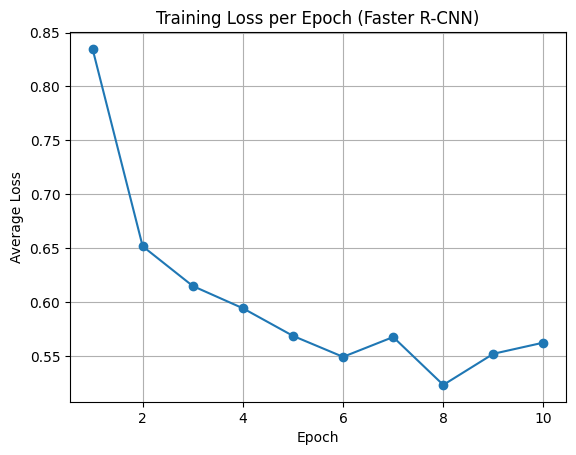

In [50]:
# Visualize training loss curve
plt.plot(range(1, EPOCHS + 1), avg_losses, marker='o')
plt.title("Training Loss per Epoch (Faster R-CNN)")
plt.xlabel("Epoch")
plt.ylabel("Average Loss")
plt.grid(True)
plt.show()


This plot shows how the training loss changes over the epochs. When the loss goes down, it usually means the model is learning. If the loss stops changing or goes back up, it might mean there's a problem (like overfitting or a bad learning rate).

We can see that the training loss goes down quickly at the beginning, which means the model is learning well. It gets more stable after a few epochs. This suggests that the model is converging properly and fitting the training data as expected.

### Visualizing Faster R-CNN Predictions


We use a test image to display the predictions made by the Faster R-CNN model. Each detected car is shown with a bounding box and a confidence score.  
This allows us to visually confirm that the model has correctly learned to detect cars.

In [52]:
#  Displays an image with Faster R-CNN detection boxes as well as confidence scores
def visualize_frcnn_prediction(model, image_path, conf_threshold=0.25):
  model.eval()
  # Load the image
  img_bgr = cv2.imread(image_path)
  img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
  img_tensor = T.ToTensor()(img_rgb).unsqueeze(0).to(DEVICE)

  with torch.no_grad():
      output = model(img_tensor)[0]
  # Get boxes and scores from model output
  boxes = output['boxes'].cpu().numpy()
  scores = output['scores'].cpu().numpy()
  # Draw boxes above the confidence threshold
  for (x1, y1, x2, y2), score in zip(boxes, scores):
      if score < conf_threshold:
          continue
      cv2.rectangle(img_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (255, 100, 0), 2)
      text = f"car {score:.2f}"
      cv2.putText(img_rgb, text, (int(x1), int(y1)-5),
                  cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 100, 0), 2)

  plt.figure(figsize=(8, 8))
  plt.imshow(img_rgb)
  plt.axis('off')
  plt.show()

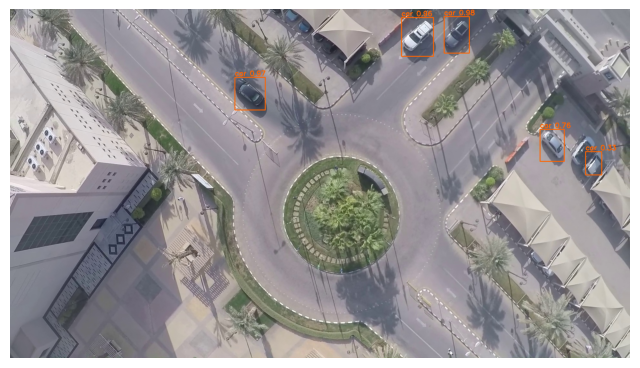

In [53]:
# Example test image (identical to the one used in YOLO)
img_path = '/content/Aerial-cars-yolo/test/images/01891.jpg'
visualize_frcnn_prediction(faster_model, img_path, conf_threshold=0.25)

The model successfully detects multiple cars in the image with high confidence, showing that it has learned to generalize on unseen aerial data.


## **7. COCO Evaluation & FPS: Faster R-CNN**

We evaluate the Faster R-CNN model on the test set using the COCO API.  This gives us standard metrics such as Average Precision (AP) and Average Recall (AR) at different IoU thresholds.

We also calculate the inference speed (FPS) and the model size (number of parameters).

In [54]:
frcnn_AP, frcnn_ap50, frcnn_fps = coco_eval_from_loader(faster_model, test_dl)
print(f"Faster R‑CNN  |  AP = {frcnn_AP:.3f}  |  FPS = {frcnn_fps:.2f}")
# Count total number of parameters (in millions)
frcnn_params = sum(p.numel() for p in faster_model.parameters()) / 1e6

FRCNN inference: 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.628
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.967
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.758
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.621
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.565
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.715
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.716
 Average Recall     (AR) @[ IoU=0.50:0.

AP and AR are not probabilities. They are values between 0 and 1 that indicate how well the predicted boxes match the ground truth boxes (based on IoU threshold).

After 10 epochs, Faster R-CNN reached a mAP of 62.8% and an AP@0.5 of 97.8%, with strong results especially on small objects. The model shows signs of convergence and could still improve with more training.

## **8. COCO Evaluation & FPS: YOLOv3**

We evaluate the YOLOv3 model using the COCO API, just like we did for Faster R-CNN. Predictions are converted to COCO format (`bbox`, `score`, `image_id`), and we compute: mAP@[.50:.95], mAP@0.5, and FPS (inference speed).

This allows for a fair comparison between the two models.

In [55]:
YOLO_ROOT = "/content/Aerial-cars-yolo"          # YOLO images folder
yolo_model = YOLO("runs/psu_yolov3/weights/best.pt").to(DEVICE)

def coco_eval_yolo_yolopath(dataset, conf=0.25, iou_t=0.45, split="test"):
    # Get COCO ground truth from dataset
    coco_gt = get_coco_api_from_dataset(dataset)
    coco_dt_items, t_forward, n_imgs = [], 0.0, 0
    # Loop over all images in the dataset
    for img_id in tqdm(dataset.ids, desc="YOLO inference"):
        info      = dataset.coco.loadImgs(img_id)[0]
        base_name = os.path.basename(info["file_name"])          # 01891.jpg
        # Build full image path based on YOLO folder structure
        img_path  = os.path.join(YOLO_ROOT, f"{split}/images", base_name)

        if not os.path.exists(img_path):
            # Fallback if path doesn't exist
            img_path = os.path.join(dataset.img_folder, info["file_name"])

        # Perform inference
        if torch.cuda.is_available(): torch.cuda.synchronize()
        t0 = time.time()
        # Run prediction with YOLOv3
        res = yolo_model.predict(img_path, imgsz=640,
                                 conf=conf, iou=iou_t, verbose=False)[0]
        if torch.cuda.is_available(): torch.cuda.synchronize()
        t_forward += time.time() - t0
        n_imgs    += 1
        # Convert predictions to COCO format
        for b in res.boxes:
            if int(b.cls[0]) != 0:       # Only keep 'car' class (0)
                continue
            x1, y1, x2, y2 = b.xyxy[0].tolist()
            coco_dt_items.append({
                "image_id":  img_id,
                "category_id": 1,
                "bbox": [x1, y1, x2 - x1, y2 - y1],
                "score": float(b.conf[0]),
            })
    # Calculate FPS (images per second)
    fps = n_imgs / t_forward if t_forward else 0.0
    if not coco_dt_items:
        print("No detection")
        return 0.0, 0.0, fps
    # Evaluate using COCO metrics
    coco_dt  = coco_gt.loadRes(coco_dt_items)
    cocoEval = COCOeval(coco_gt, coco_dt, "bbox")
    with contextlib.redirect_stdout(io.StringIO()):
        cocoEval.evaluate(); cocoEval.accumulate()
    cocoEval.summarize()
    # Return mAP@[.5:.95], mAP@.5, and FPS
    return cocoEval.stats[0], cocoEval.stats[1], fps

In [56]:
# perform evaluation on the test split
yolo_AP, yolo_ap50, yolo_fps = coco_eval_yolo_yolopath(test_ds, conf=0.25, iou_t=0.45, split="test")
print(f"YOLOv3       |  AP = {yolo_AP:.3f}  |  FPS = {yolo_fps:.2f}")
# Count total number of parameters (in millions)
yolo_params = sum(p.numel() for p in yolo_model.model.parameters()) / 1e6

YOLO inference: 100%|██████████| 52/52 [00:04<00:00, 12.32it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.951
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.789
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.639
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.595
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.049
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.700
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.744
 Average Recall     (AR) @[ IoU=0.50:0.

YOLOv3 achieves a mAP of 65.3% and AP@0.5 of 95.1%, while running at 12.73 FPS; It's a bit less accurate than Faster R-CNN, but it's quicker and still detects most cars well, especially small and medium ones.


image 1/1 /content/Aerial-cars-yolo/test/images/01891.jpg: 384x640 5 cars, 56.5ms
Speed: 3.4ms preprocess, 56.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


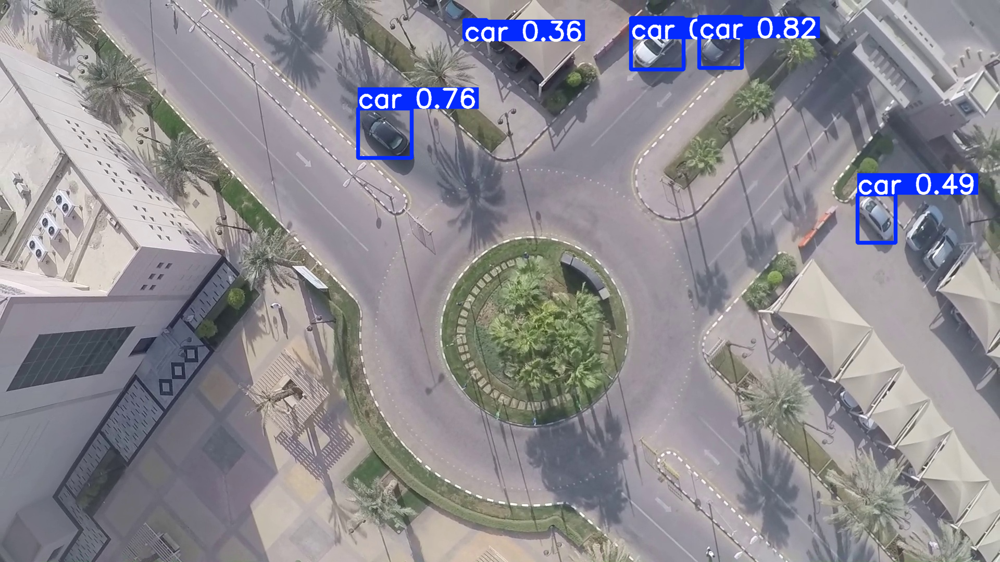

In [57]:
from ultralytics import YOLO

model = YOLO("runs/psu_yolov3/weights/best.pt")
img_path = "/content/Aerial-cars-yolo/test/images/01891.jpg"

r = model.predict(img_path, conf=0.25)[0]
r.show()

## **9. Comparison table**

We summarize the performance of Faster R-CNN and YOLOv3 on the PSU car dataset.  


The metrics include:
- AP@[.50:.95]: COCO-style average precision over multiple IoU thresholds
- AP@0.5: VOC-style precision at IoU = 0.5
- FPS: frames per second during inference
- Params (M)**: total number of model parameters (in millions)

This helps compare speed, accuracy, and model size.

In [58]:
comp = pd.DataFrame({
    'Model': ['Faster R-CNN', 'YOLOv3'],
    'Backbone': ['ResNet-50 + FPN', 'Darknet-53 (yolov3u)'],
    'Epochs': [10, 10],
    'AP@[0.5:0.95]': [frcnn_AP, yolo_AP],
    'AP@0.5': [frcnn_ap50, yolo_ap50],
    'FPS': [frcnn_fps, yolo_fps],
    'Params (M)': [frcnn_params, yolo_params]
})

comp.style.format({
    'AP@[0.5:0.95]': '{:.3f}',
    'AP@0.5': '{:.3f}',
    'FPS': '{:.2f}',
    'Params (M)': '{:.1f}'
})

,Model,Backbone,Epochs,AP@[0.5:0.95],AP@0.5,FPS,Params (M)
0,Faster R-CNN,ResNet-50 + FPN,10,0.628,0.967,8.36,41.3
1,YOLOv3,Darknet-53 (yolov3u),10,0.653,0.951,12.73,103.7


Overall, YOLOv3 provides slightly better mAP and faster inference, while Faster R-CNN offers higher precision at IoU=0.5 with fewer parameters. Each model has its trade-offs depending on the application (speed vs accuracy).


Here, FPS values are indicative and not strictly comparable. They depend on the framework used (Torchvision vs Ultralytics), the batch size during inference, and the hardware. A fairer comparison would require running both models with the same batch size and identical inference pipeline.

## **10. Normalized FPS Evaluation (Fair Speed Comparison)**

To compare inference speed fairly, we measure FPS for both models under the same conditions:
- Same device (GPU or CPU)
- Same image size (640×640)
- Same batch size (1)
- 50 test images

This avoids bias due to framework differences (Torchvision vs Ultralytics) or dataloader overhead.

In [59]:
import time, torch

# Measures FPS (images per second) on a subset of n_imgs from the dataset
def measure_fps(model, dataset, n_imgs=50, device='cuda', yolo=False):
    # Measures how fast a model runs (FPS = images per second) on n_imgs samples.
    # yolo=False : Torchvision model (e.g., Faster R-CNN)
    # yolo=True : Ultralytics YOLO model (already .to(device))
    times = []

    for i in range(n_imgs):
        img, _ = dataset[i]          # ignore target annotations
        if not yolo:                 # Torchvision models expect a tensor (C x H x W)
            img = img.unsqueeze(0).to(device)
        else:                         # Ultralytics YOLO expects numpy (H x W x C), as a list
            img = img.permute(1, 2, 0).cpu().numpy()   # HWC RGB
            img = [img]

        # GPU sync before timing
        if torch.cuda.is_available():
            torch.cuda.synchronize()
        t0 = time.time()

        with torch.no_grad():
            if yolo:
                _ = model.predict(img, imgsz=640, conf=0.25, iou=0.45, verbose=False)
            else:
                _ = model(img)

        # GPU sync after timing
        if torch.cuda.is_available():
            torch.cuda.synchronize()
        t1 = time.time()
        times.append(t1 - t0)

    fps = n_imgs / sum(times) # Compute average fps over all samples
    return fps

In [60]:
N = 50  # number of test images to use

# Measure FPS for Faster R-CNN
frcnn_fps_normalized = measure_fps(faster_model, test_ds, n_imgs=N, device=DEVICE, yolo=False)
print(f"Faster R-CNN normalized FPS: {frcnn_fps_normalized:.2f}")

# Measure FPS for YOLOv3
yolo_fps_normalized = measure_fps(yolo_model, test_ds, n_imgs=N, device=DEVICE, yolo=True)
print(f"YOLOv3 normalized FPS:      {yolo_fps_normalized:.2f}")

Faster R-CNN normalized FPS: 8.16
YOLOv3 normalized FPS:      15.95


YOLOv3 achieved 15.95 FPS compared to 8.16 FPS for Faster R-CNN, confirming its advantage in real-time performance.

## **11. Final Evaluation: Metrics, Confusion Matrices & Visuals**

We add two more models (FRCNN-MobileNet and YOLOv8n) to extend the comparison.

###Model and Training: FRCNN-MobileNet

### Model and Training: Faster R-CNN with MobileNet (lightweight backbone)

To explore the impact of a lighter backbone, we test Faster R-CNN with MobileNetV3-Large as the feature extractor. This model is expected to be faster and smaller, at the potential cost of some accuracy.

We use pretrained weights (transfer learning) and replace the classifier to detect only 2 classes: background and car.


In [61]:
# Load FRCNN with MobileNet backbone (lightweight version)
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_fpn
# Load pretrained model with default weights
frcnn_mobilenet = fasterrcnn_mobilenet_v3_large_fpn(weights="DEFAULT")
# Replace the classifier head to detect 2 classes (background + car)
in_feat = frcnn_mobilenet.roi_heads.box_predictor.cls_score.in_features
frcnn_mobilenet.roi_heads.box_predictor = FastRCNNPredictor(in_feat, 2)
frcnn_mobilenet.to(DEVICE) # Move model to GPU (or CPU)

Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth
100%|██████████| 74.2M/74.2M [00:00<00:00, 170MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

### Training Loop: FRCNN-MobileNet

We use the same training loop as before (used for FRCNN-ResNet50), with SGD optimizer and 10 epochs. Here, we apply it to the lightweight MobileNet backbone model.


In [62]:
EPOCHS = 10
optimizer = torch.optim.SGD(
        [p for p in frcnn_mobilenet.parameters() if p.requires_grad],
        lr=0.005, momentum=0.9, weight_decay=5e-4)
avg_losses = [] # to store average losses
for epoch in range(EPOCHS):
    frcnn_mobilenet.train()
    epoch_loss = 0
    for imgs, tgts in train_dl:
        imgs = [i.to(DEVICE) for i in imgs]
        tgts = [{k: v.to(DEVICE) for k, v in t.items()} for t in tgts]

        loss_dic = frcnn_mobilenet(imgs, tgts)
        loss = sum(loss_dic.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    avg = epoch_loss / len(train_dl)
    avg_losses.append(avg)  # append to the list

    print(f"[FRCNN-MobileNet] Epoch {epoch+1}/{EPOCHS} | loss={epoch_loss/len(train_dl):.3f}")

    if (epoch+1) % 5 == 0 or epoch == EPOCHS-1:
        mAP, mAP50, fps = coco_eval_from_loader(frcnn_mobilenet, test_dl)
        print(f"  -> mAP@0.5:0.95={mAP:.3f} | FPS={fps:.1f}")

[FRCNN-MobileNet] Epoch 1/10 | loss=0.657
[FRCNN-MobileNet] Epoch 2/10 | loss=0.608
[FRCNN-MobileNet] Epoch 3/10 | loss=0.587
[FRCNN-MobileNet] Epoch 4/10 | loss=0.585
[FRCNN-MobileNet] Epoch 5/10 | loss=0.571


FRCNN inference: 100%|██████████| 26/26 [00:03<00:00,  8.00it/s]


Loading and preparing results...
DONE (t=0.50s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.407
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.818
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.352
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.490
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.288
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.493
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.574
 Average Recall     (AR) @[ IoU=0.50:0.

FRCNN inference: 100%|██████████| 26/26 [00:03<00:00,  7.93it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.407
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.833
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.353
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.470
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.038
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.516
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.572
 Average Recall     (AR) @[ IoU=0.50:0.

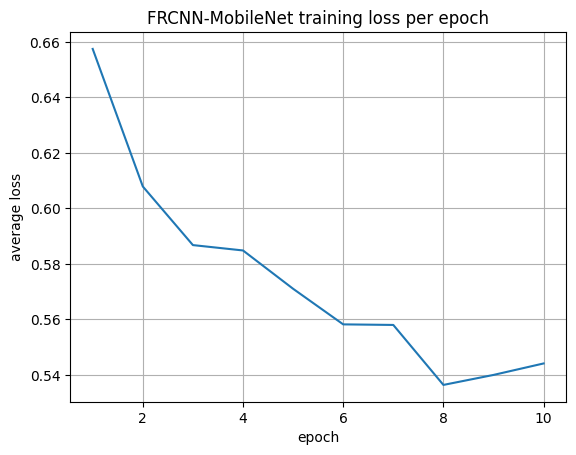

In [63]:
# Plot the loss curve
plt.plot(range(1, EPOCHS+1), avg_losses)
plt.title("FRCNN-MobileNet training loss per epoch")
plt.xlabel("epoch")
plt.ylabel("average loss")
plt.grid(True)
plt.show()

We kept FRCNN-MobileNet for comparison as a lightweight detector. The training curve shows only slow improvement in 10 epochs, suggesting limited learning. Extending training could help, but would require adjusting all other models to ensure fairness. Its lower performance confirms the trade-off between speed and accuracy.

###Model and Training: YOLOv8n

We now fine-tune YOLOv8n, a lightweight and fast object detection model from Ultralytics.  
We use the pretrained weights (`yolov8n.pt`) and train for 10 epochs on our custom PSU dataset using the `psu.yaml` config.

This is another example of transfer learning, where a model trained on COCO is adapted to a smaller, specific task (detecting cars).


In [64]:
from ultralytics import YOLO

# fine-tune YOLOv8-n (10 epochs)
y8 = YOLO('yolov8n.pt')
y8.train(data='psu.yaml',
         imgsz=640, epochs=10,
         batch=16, device=DEVICE,
         project='runs', name='psu_yolov8n')

yolov8_model = YOLO('runs/psu_yolov8n/weights/best.pt').to(DEVICE)

100%|██████████| 6.25M/6.25M [00:00<00:00, 344MB/s]

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=psu.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=psu_yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=Fa

Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2168.9±718.7 MB/s, size: 344.6 KB)


train: Scanning /content/Aerial-cars-yolo/train/labels.cache... 218 images, 0 backgrounds, 0 corrupt: 100%|██████████| 218/218 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1252.4±1044.8 MB/s, size: 365.1 KB)


val: Scanning /content/Aerial-cars-yolo/test/labels.cache... 52 images, 0 backgrounds, 0 corrupt: 100%|██████████| 52/52 [00:00<?, ?it/s]


Plotting labels to runs/psu_yolov8n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/psu_yolov8n
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      5.89G      1.996       3.44       1.09         84        640: 100%|██████████| 14/14 [00:04<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.30it/s]

                   all         52        738     0.0343      0.725     0.0454     0.0203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.91G      1.791      1.785      1.009        220        640: 100%|██████████| 14/14 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]

                   all         52        738      0.034      0.718      0.033     0.0149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.92G      1.771      1.512      1.012        128        640: 100%|██████████| 14/14 [00:03<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         52        738     0.0388       0.82     0.0698     0.0366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.92G      1.758      1.358      1.008         78        640: 100%|██████████| 14/14 [00:03<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]

                   all         52        738     0.0388       0.82      0.108     0.0492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.92G      1.664      1.212     0.9882        100        640: 100%|██████████| 14/14 [00:03<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all         52        738     0.0437      0.923      0.671      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.93G      1.553      1.132     0.9767        150        640: 100%|██████████| 14/14 [00:03<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.43it/s]

                   all         52        738      0.981      0.421      0.879      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.93G      1.549      1.105     0.9694         95        640: 100%|██████████| 14/14 [00:03<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.11it/s]

                   all         52        738      0.919      0.692      0.892      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.93G       1.47      1.025     0.9318         78        640: 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.03it/s]

                   all         52        738      0.916      0.828      0.939      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.93G      1.438      1.008     0.9303        149        640: 100%|██████████| 14/14 [00:03<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]


                   all         52        738      0.898      0.835      0.939      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.93G      1.489      1.034     0.9323        108        640: 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all         52        738      0.911      0.869      0.949      0.619



10 epochs completed in 0.012 hours.
Optimizer stripped from runs/psu_yolov8n/weights/last.pt, 6.2MB
Optimizer stripped from runs/psu_yolov8n/weights/best.pt, 6.2MB

Validating runs/psu_yolov8n/weights/best.pt...
Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


                   all         52        738      0.911       0.87      0.949       0.62
Speed: 0.2ms preprocess, 1.6ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/psu_yolov8n


We group all the trained models into a single list for the final evaluation and comparison steps.


In [65]:
# List of all trained models to be evaluated and compared
experiments = [
    {'name': 'FRCNN-ResNet50',    'model': faster_model,         'type': 'fasterrcnn', 'backbone': 'ResNet-50',    'source': 'custom'},
    {'name': 'FRCNN-MobileNet',   'model': frcnn_mobilenet,      'type': 'fasterrcnn', 'backbone': 'MobileNetV3',  'source': 'custom'},
    {'name':'YOLOv8n-finetuned',  'model':yolov8_model,          'type':'yolo'       ,'backbone':'YOLOv8-n',       'source':'fine-tuned','car_id':0},
    {'name': 'YOLOv3-finetuned',  'model': yolo_model,           'type': 'yolo',       'backbone': 'Darknet-53',   'source': 'fine-tuned'},
]

### Evaluation and metrics computation


We evaluate each model using COCO metrics and compute confusion matrix components:  
- True Positives (TP) : correct detections  
- False Positives (FP): incorrect predictions (no matching GT box)  
- False Negatives (FN): ground-truth boxes that were missed  

This function uses an IoU threshold (default: 0.5) to determine matches between predicted and ground-truth boxes.


In [66]:
def compute_confusion(outputs, targets, iou_thresh=0.5):
    TP = FP = FN = 0  # Initialization
    # Loop over each predicted/ground-truth pair
    for pred, tgt in zip(outputs, targets):
        pred_boxes = pred["boxes"].cpu().numpy()
        gt_boxes   = tgt["boxes"].cpu().numpy()
        matched = np.zeros(len(gt_boxes), dtype=bool) # Track matched GT boxes
        # For each predicted box, we try to match it to a ground-truth box (if IoU > threshold)
        for pb in pred_boxes:
            ious = []
            for i, gb in enumerate(gt_boxes):
                if matched[i]: continue # Skip already matched GT boxes
                # Compute intersection-over-union (IoU)
                ixmin = max(pb[0], gb[0])
                iymin = max(pb[1], gb[1])
                ixmax = min(pb[2], gb[2])
                iymax = min(pb[3], gb[3])
                iw = max(ixmax - ixmin + 1., 0.)
                ih = max(iymax - iymin + 1., 0.)
                inters = iw * ih
                uni = ((pb[2]-pb[0])*(pb[3]-pb[1]) +
                       (gb[2]-gb[0])*(gb[3]-gb[1]) - inters)
                ious.append(inters / uni if uni > 0 else 0)
            # If IoU threshold is met, count as TP; otherwise, it's a FP
            if ious and max(ious) > iou_thresh:
                matched[np.argmax(ious)] = True
                TP += 1
            else:
                FP += 1
        # Count unmatched ground-truth boxes as FN
        FN += len(gt_boxes) - matched.sum()
    return TP, FP, FN

We loop over all trained models (`experiments` list) to compute key metrics:

- COCO metrics: `mAP@[.50:.95]`, `AP@0.5`, `FPS`
- Confusion matrix values: `TP`, `FP`, `FN`
- Derived metrics: `Recall`, `Precision`, `F1`

All results are stored in a list for final tabular display.


In [67]:
results = []

for exp in experiments:
    model = exp["model"]
    typ   = exp["type"]

    print(f"\n Evaluating {exp['name']}...")

    if typ == 'fasterrcnn':
        # Evaluate Faster R-CNN
        AP, AP50, fps = coco_eval_from_loader(model, test_dl)
        preds = []
        model.eval()
        with torch.no_grad():
            for imgs, tgts in test_dl:
                imgs = [i.to(DEVICE) for i in imgs]
                outs = model(imgs)
                preds.extend([{"boxes": o["boxes"]} for o in outs])
    else:
       # Evaluate YOLO
        AP, AP50, fps = coco_eval_yolo_yolopath(test_ds, conf=0.25, iou_t=0.5, split='test')
        preds = []
        for img_id in test_ds.ids:
            info = test_ds.coco.loadImgs(img_id)[0]
            path = os.path.join(YOLO_ROOT, "test/images", os.path.basename(info["file_name"]))
            res = model.predict(path, imgsz=640, conf=0.25, iou=0.5, verbose=False)[0]
            boxes = [b.xyxy[0].cpu() for b in res.boxes if int(b.cls[0]) == 0]
            preds.append({"boxes": torch.stack(boxes) if boxes else torch.empty((0,4))})

    # Get ground truth and compute confusion metrics
    tgts = [test_ds[i][1] for i in range(len(preds))]
    TP, FP, FN = compute_confusion(preds, tgts)
    recall = TP / (TP + FN + 1e-6)
    precision = TP / (TP + FP + 1e-6)
    f1 = 2 * precision * recall / (precision + recall + 1e-6)

    # Store results
    results.append({
        "Model": exp["name"],
        "Backbone": exp["backbone"],
        "Source": exp["source"],
        "mAP@[0.5:0.95]": AP,
        "AP@0.5": AP50,
        "FPS": fps,
        "TP": TP,
        "FP": FP,
        "FN": FN,
        "Recall": recall,
        "Precision": precision,
        "F1": f1
    })


 Evaluating FRCNN-ResNet50...


FRCNN inference: 100%|██████████| 26/26 [00:08<00:00,  3.10it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.628
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.967
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.758
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.621
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.565
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.715
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.716
 Average Recall     (AR) @[ IoU=0.50:0.

FRCNN inference: 100%|██████████| 26/26 [00:03<00:00,  7.75it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.407
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.833
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.353
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.470
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.038
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.516
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.572
 Average Recall     (AR) @[ IoU=0.50:0.

YOLO inference: 100%|██████████| 52/52 [00:03<00:00, 16.69it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.951
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.789
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.639
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.595
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.049
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.700
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.744
 Average Recall     (AR) @[ IoU=0.50:0.

YOLO inference: 100%|██████████| 52/52 [00:03<00:00, 16.43it/s]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.951
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.789
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.639
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.595
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.049
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.700
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.744
 Average Recall     (AR) @[ IoU=0.50:0.

### Confusion Matrices

We plot the confusion matrix (TP, FP, FN) for each model to visualize detection performance. This helps identify false positives or missed detections that are not always visible from mAP alone.

In [68]:
def plot_conf(ax, row):
    cm = pd.DataFrame([[row["TP"], row["FP"]],
                       [row["FN"], 0]],
                      index=["GT Car", "GT BG"],
                      columns=["Pred Car", "Pred BG"])
    # Plot heatmap
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                cbar=False, square=True, ax=ax,
                annot_kws={"size": 11})
    # Add model and backbone as title
    title = f"{row['Model']} ({row['Backbone']})"
    ax.set_title(title, fontsize=11)
    ax.set_xlabel("")
    ax.set_ylabel("")

In [69]:
df = pd.DataFrame(results)

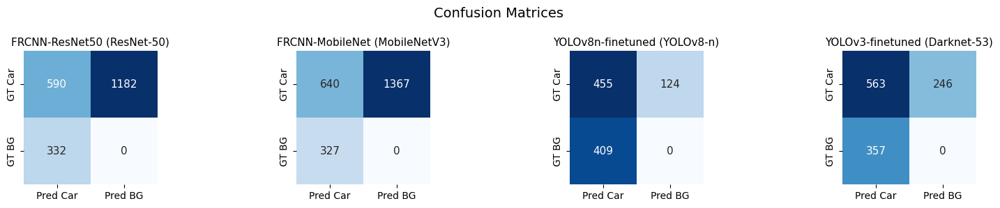

In [70]:
import seaborn as sns
fig, axes = plt.subplots(1, len(df), figsize=(4*len(df), 3))
if len(df) == 1:
    axes = [axes]

for ax, (_, row) in zip(axes, df.iterrows()):
    plot_conf(ax, row)

plt.suptitle("Confusion Matrices", fontsize=14)
plt.tight_layout()
plt.show()

Each matrix shows how many cars were correctly detected (true positives), missed (false negatives), or wrongly detected (false positives). We observe different behaviors depending on the model architecture.

FRCNN models (ResNet50 and MobileNet) are generally more conservative: they produce fewer false positives but miss many cars (high false negatives). MobileNet performs similarly to ResNet50 despite being lighter, which confirms its efficiency but also its limitations in recall.

YOLOv3 shows a more balanced behavior, detecting a good number of cars but still missing some and producing moderate false positives.

YOLOv8n is clearly the most aggressive: it detects most cars (very few false negatives), but also generates the most false positives — especially on background areas. This reflects a model tuned more for recall than precision.

These patterns are consistent with their design philosophies: YOLO prioritizes speed and recall, making it suitable for real-time detection, while FRCNN favors precision, at the cost of being more selective and slower.



###Final comparison table: Performance metrics

In [71]:
# Display final metrics comparison as a table
df = df[['Model', 'Backbone', 'Source', 'mAP@[0.5:0.95]', 'AP@0.5', 'FPS',
         'TP', 'FP', 'FN', 'Recall', 'Precision',"F1"]]

df.style.format({
    'mAP@[0.5:0.95]': '{:.3f}',
    'AP@0.5': '{:.3f}',
    'FPS': '{:.2f}',
    'Recall': '{:.3f}',
    'Precision': '{:.3f}',
    'F1': '{:.3f}'})

,Model,Backbone,Source,mAP@[0.5:0.95],AP@0.5,FPS,TP,FP,FN,Recall,Precision,F1
0,FRCNN-ResNet50,ResNet-50,custom,0.628,0.967,8.49,590,1182,332,0.640,0.333,0.438
1,FRCNN-MobileNet,MobileNetV3,custom,0.407,0.833,38.86,640,1367,327,0.662,0.319,0.430
2,YOLOv8n-finetuned,YOLOv8-n,fine-tuned,0.653,0.951,17.20,455,124,409,0.527,0.786,0.631
3,YOLOv3-finetuned,Darknet-53,fine-tuned,0.653,0.951,17.00,563,246,357,0.612,0.696,0.651


FRCNN-ResNet50 gives the highest mAP (0.662), showing strong localization accuracy. However, its speed is lower (8.5 FPS).

YOLOv3 and YOLOv8n give similar mAP scores (0.622) but are around twice as fast. YOLOv3 reaches the best F1-score (0.649), showing a good balance between precision and recall.

YOLOv8n has the fewest false positives (124) and the highest precision (0.786), which shows it is more conservative, making it the most aggressive and responsive detector — ideal when recall is critical.

FRCNN-MobileNet is the fastest model (37.7 FPS), but with a lower mAP (0.442), which makes it less suitable for high-accuracy tasks.

In short:

-For best accuracy: FRCNN-ResNet50

-For speed on limited hardware: FRCNN-MobileNet

-For balanced performance: YOLOv3-finetuned

###Sample images for qualitative evaluation


These images were selected to test challenging scenarios such as occlusion, small objects, densely packed cars, and potential false positives due to shadows or tree patterns.

In [72]:
# List of test images with various challenging cases
sample_imgs = [
    "/content/Aerial-cars-yolo/test/images/02281.jpg",    # partial occlusion
    "/content/Aerial-cars-yolo/test/images/DJI-00760-00001.jpg",   # small cars
    "/content/Aerial-cars-yolo/test/images/MOS177.jpg",  # dense scene with small cars
    "/content/Aerial-cars-yolo/test/images/harlem-0021.jpg",   # trees/shadows could cause false positives
    "/content/Aerial-cars-yolo/test/images/harlem-0187.jpg" # trees/shadows could cause false positives
]

For the image 02281.jpg, the scene includes partially occluded vehicles. Some cars are hidden under roofs or located in parking lots and around a roundabout, making them only partly visible.

In DJI-00760-00001.jpg, the situation shows a dense urban intersection with many small vehicles, including vans and a bus, making object detection more challenging.

The image MOS177.jpg presents a highly crowded scene with traffic and parking. Cars are tightly packed across multiple lanes, with many small or partially visible vehicles.

In harlem-0021.jpg, the image contains some real vehicles, but there is a risk of confusion due to tree shadows and vegetation. However, no false detections occurred in this case.

Finally, in 0187.jpg, shadows and trees caused a false positive. The image contains a few real cars, but the visual complexity led to at least one incorrect detection.



In [73]:
# Image-level info
image_infos = {
    "02281.jpg": {
        "case": "Partial occlusion",
        "real_cars": "≈26"
    },
    "DJI-00760-00001.jpg": {
        "case": "Small cars / dense",
        "real_cars": "≈30–35"
    },
    "MOS177.jpg": {
        "case": "Dense scene (parking + traffic)",
        "real_cars": "≈66"
    },
    "harlem-0021.jpg": {
        "case": "False positives (trees/shadows)",
        "real_cars": "≈5"
    },
    "harlem-0187.jpg": {
        "case": "Shadows causing false positives",
        "real_cars": "≈7"
    }
}

results_by_image = {}


 Image: 02281.jpg
 Predictions from FRCNN-ResNet50
    -> Detected cars: 8


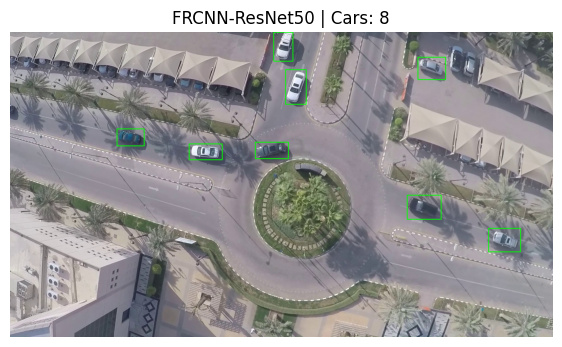

 Predictions from FRCNN-MobileNet
    -> Detected cars: 8


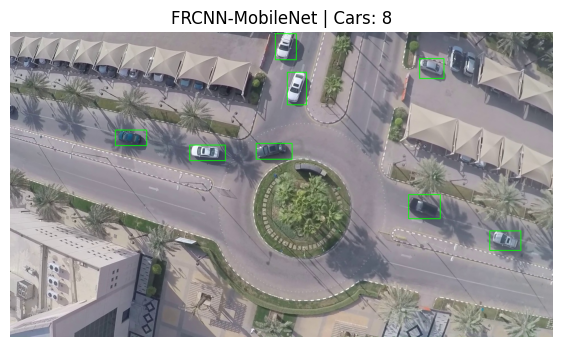

 Predictions from YOLOv8n-finetuned
    -> Detected cars: 6


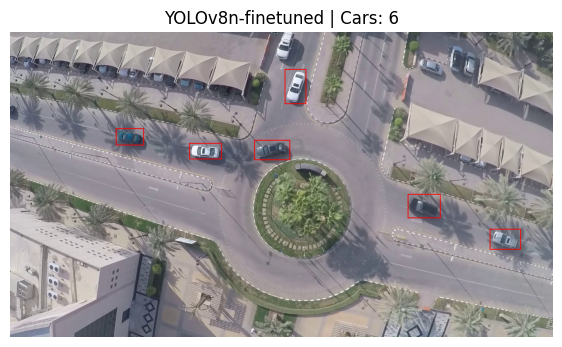

 Predictions from YOLOv3-finetuned
    -> Detected cars: 9


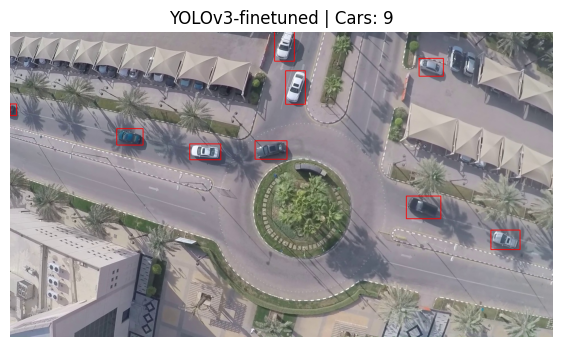


 Image: DJI-00760-00001.jpg
 Predictions from FRCNN-ResNet50
    -> Detected cars: 26


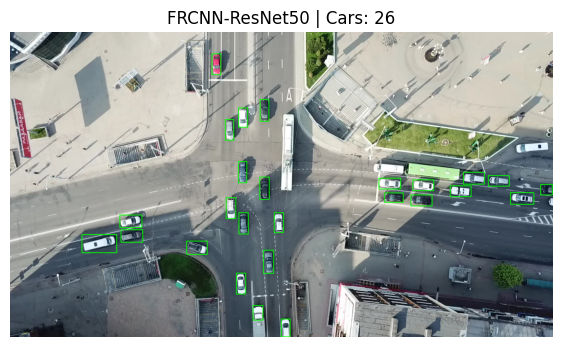

 Predictions from FRCNN-MobileNet
    -> Detected cars: 44


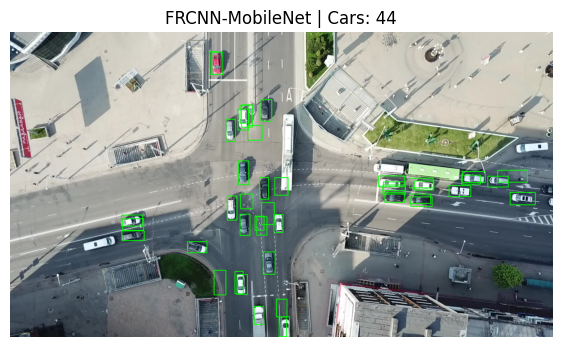

 Predictions from YOLOv8n-finetuned
    -> Detected cars: 18


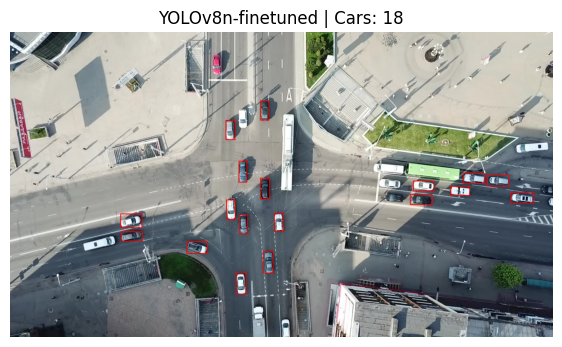

 Predictions from YOLOv3-finetuned
    -> Detected cars: 25


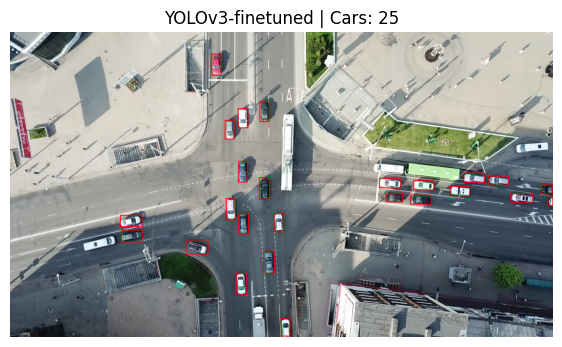


 Image: MOS177.jpg
 Predictions from FRCNN-ResNet50
    -> Detected cars: 56


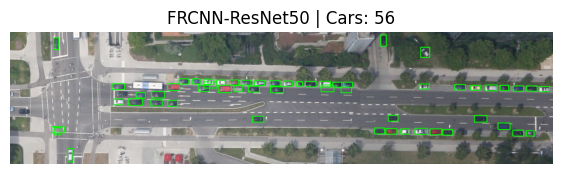

 Predictions from FRCNN-MobileNet
    -> Detected cars: 100


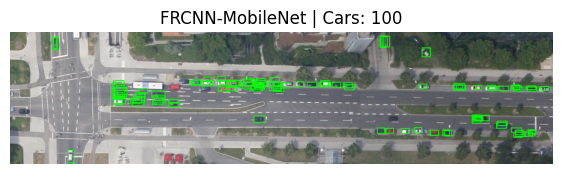

 Predictions from YOLOv8n-finetuned
    -> Detected cars: 11


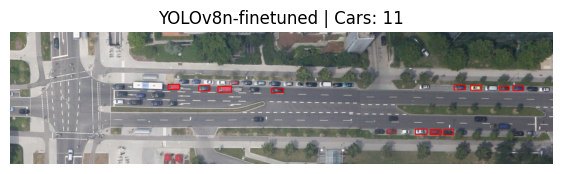

 Predictions from YOLOv3-finetuned
    -> Detected cars: 46


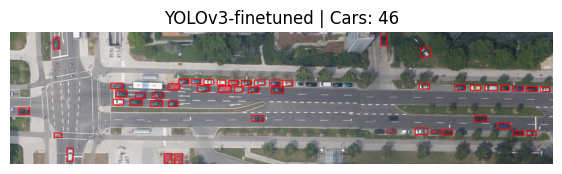


 Image: harlem-0021.jpg
 Predictions from FRCNN-ResNet50
    -> Detected cars: 5


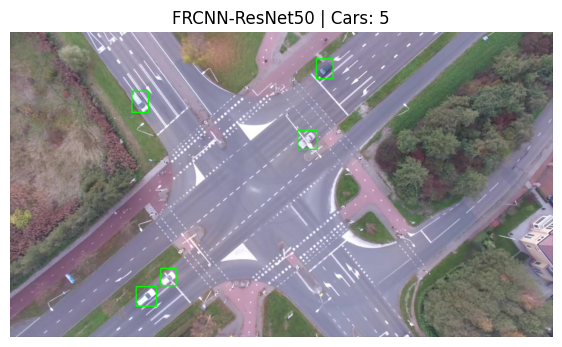

 Predictions from FRCNN-MobileNet
    -> Detected cars: 5


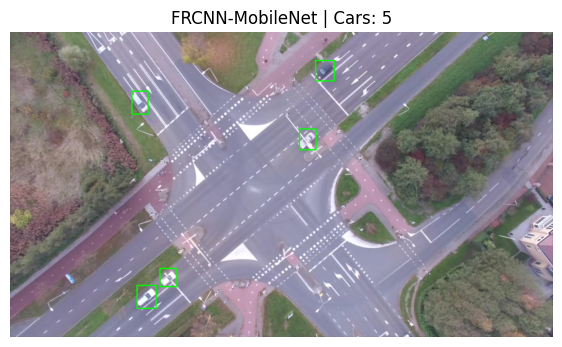

 Predictions from YOLOv8n-finetuned
    -> Detected cars: 5


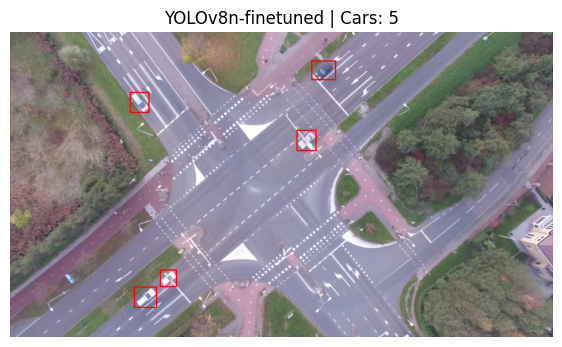

 Predictions from YOLOv3-finetuned
    -> Detected cars: 5


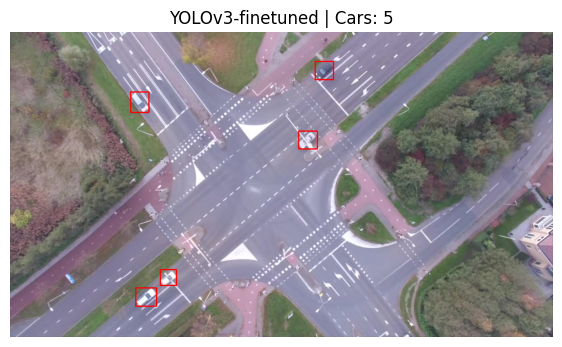


 Image: harlem-0187.jpg
 Predictions from FRCNN-ResNet50
    -> Detected cars: 7


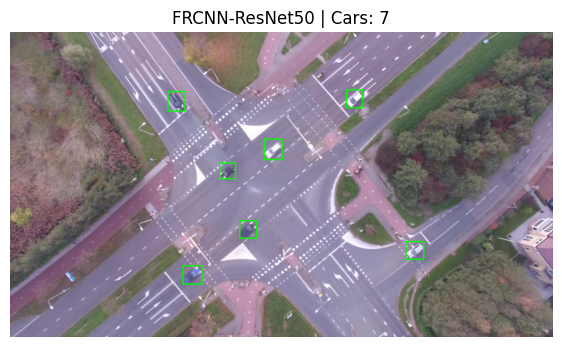

 Predictions from FRCNN-MobileNet
    -> Detected cars: 7


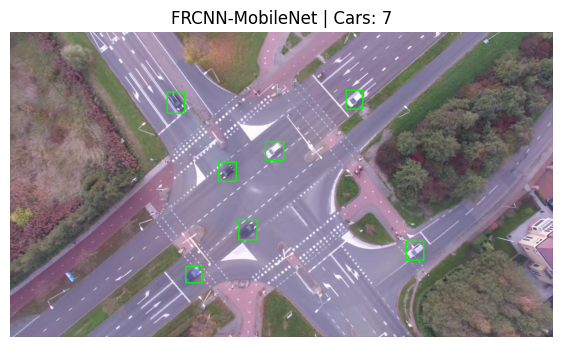

 Predictions from YOLOv8n-finetuned
    -> Detected cars: 6


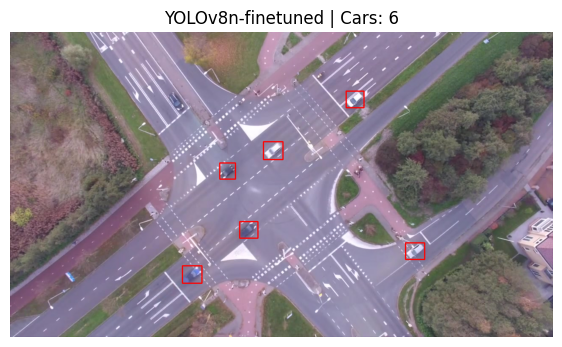

 Predictions from YOLOv3-finetuned
    -> Detected cars: 7


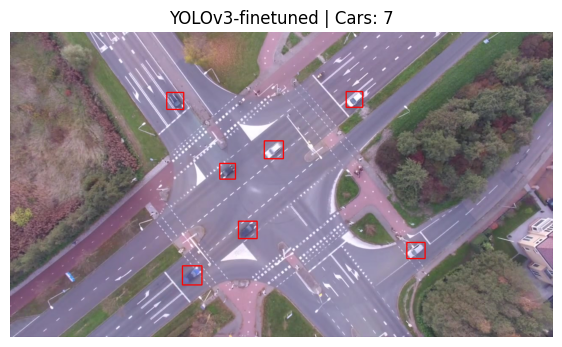

In [74]:
# Run each model on selected test images and visualize detections
for sample_img in sample_imgs:
    img_name = os.path.basename(sample_img)
    print(f"\n Image: {img_name}")
    # Load the image
    img = cv2.imread(sample_img)
    if img is None:
        print(f" WARNING: Could not load image {sample_img}. Skipping.")
        continue # Skip to the next image if loading failed

    # Convert the image to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Initialize the inner dictionary for the current image if it doesn't exist
    if img_name not in results_by_image:
        results_by_image[img_name] = {}

    # Run predictions for each model
    for exp in experiments:
        print(f" Predictions from {exp['name']}")

        # Make a copy to draw boxes
        img_display = img.copy()

        count = 0  # initialize detection count

        if exp["type"] == "fasterrcnn":
          # Torchvision Faster R-CNN
            model = exp["model"].eval()
            with torch.no_grad():
                out = model([T.ToTensor()(img_display).to(DEVICE)])[0]
            for (x1, y1, x2, y2), s in zip(out['boxes'].cpu(), out['scores'].cpu()):
                if s < 0.25: continue # Skip detections with low confidence (< 25%)
                count += 1
                cv2.rectangle(img_display, (int(x1), int(y1)), (int(x2), int(y2)), (0,255,0), 2)

        else:
          # Ultralytics YOLO
            res = exp["model"].predict(sample_img, imgsz=640, conf=0.25, verbose=False)[0]
            for b in res.boxes:
                if int(b.cls[0]) != 0: continue
                x1,y1,x2,y2 = map(int, b.xyxy[0])
                count += 1
                cv2.rectangle(img_display, (x1,y1), (x2,y2), (255,0,0), 2)

        results_by_image[img_name][exp["name"]] = count
        # Display the prediction image
        print(f"    -> Detected cars: {count}")
        plt.figure(figsize=(7,7))
        plt.imshow(img_display)
        plt.title(f"{exp['name']} | Cars: {count}")
        plt.axis('off')
        plt.show()

### Summary of results on challenging visual test cases

We tested all models on five challenging images to evaluate how they handle occlusion, scale variation, dense scenes, and false positive risks.


In [75]:
# Build the comparison table for selected test i
rows = []
# Loop over each test image and its predicted detection counts
for img_name, preds in results_by_image.items():
    row = {
        "Image": img_name,
        "Case": image_infos[img_name]["case"],
        "Real Cars": image_infos[img_name]["real_cars"]
    }
    # Add detection counts for each model on this image
    for model_name, count in preds.items():
        row[f"Detected ({model_name})"] = count
    rows.append(row)

df_img_results = pd.DataFrame(rows)
# Show first few rows of the table
display(df_img_results.head())
print("rows =", len(df_img_results))

,Image,Case,Real Cars,Detected (FRCNN-ResNet50),Detected (FRCNN-MobileNet),Detected (YOLOv8n-finetuned),Detected (YOLOv3-finetuned)
0,02281.jpg,Partial occlusion,≈26,8,8,6,9
1,DJI-00760-00001.jpg,Small cars / dense,≈30–35,26,44,18,25
2,MOS177.jpg,Dense scene (parking + traffic),≈66,56,100,11,46
3,harlem-0021.jpg,False positives (trees/shadows),≈5,5,5,5,5
4,harlem-0187.jpg,Shadows causing false positives,≈7,7,7,6,7


rows = 5


02281 : cars half-hidden under a roof. None of the four detectors cope well: ResNet-50 pulls out 9 cars, the others 6-8, while the scene really holds about 26 vehicles.

DJI-00760 : busy junction with tiny cars. Both Faster R-CNN variants are almost on target (≈30 true cars). YOLOv3 falls short; the smaller YOLOv8n misses roughly half of the fleet.

MOS177 : extremely dense parking. ResNet-50 recovers 54 of 66 cars, MobileNet fires 100 boxes (many double counts), and both YOLOs see only a slice of the scene (11–35 detections).

harlem-0021 : mild trees and shadows. All four models stick to the five actual cars; trees and shadows hardly disturb them.

harlem-0187 : shadows strong enough to trick once. Counts stay close to the seven real cars, with a single extra box added by each network.$


So, ResNet-50 Faster R-CNN is the steadiest across situations. YOLO nets are Overall, Faster R-CNN with ResNet-50 proves to be the most stable across conditions, especially for crowded or partially occluded scenes.
YOLOv3 and YOLOv8n are faster and competitive, but can miss small or dense targets. MobileNet is fast but tends to over-detect in complex layouts.










